## Imported Required Librarys

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
import plotly.figure_factory as ff
from scipy import stats

### Reading the data frame

In [4]:
df = pd.read_csv(r"C:\Users\manoj\OneDrive\Desktop\inno_internship data\Task_4 EDA project\data.csv")

In [5]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,01-06-2012 00:00,present,senior quality engineer,Bangalore,f,19-02-1990 00:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,01-09-2013 00:00,present,assistant manager,Indore,m,04-10-1989 00:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,01-06-2014 00:00,present,systems engineer,Chennai,f,03-08-1992 00:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,01-07-2011 00:00,present,senior software engineer,Gurgaon,m,05-12-1989 00:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,01-03-2014 00:00,01-03-2015 00:00,get,Manesar,m,27-02-1991 00:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [6]:
df.shape

(3998, 39)

In [7]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [8]:
df.drop('Unnamed: 0',axis =1,inplace =True)

In [9]:
df

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,01-06-2012 00:00,present,senior quality engineer,Bangalore,f,19-02-1990 00:00,84.30,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,01-09-2013 00:00,present,assistant manager,Indore,m,04-10-1989 00:00,85.40,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,01-06-2014 00:00,present,systems engineer,Chennai,f,03-08-1992 00:00,85.00,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,01-07-2011 00:00,present,senior software engineer,Gurgaon,m,05-12-1989 00:00,85.60,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,01-03-2014 00:00,01-03-2015 00:00,get,Manesar,m,27-02-1991 00:00,78.00,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,47916,280000.0,01-10-2011 00:00,01-10-2012 00:00,software engineer,New Delhi,m,15-04-1987 00:00,52.09,cbse,...,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,752781,100000.0,01-07-2013 00:00,01-07-2013 00:00,technical writer,Hyderabad,f,27-08-1992 00:00,90.00,state board,...,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,355888,320000.0,01-07-2013 00:00,present,associate software engineer,Bangalore,m,03-07-1991 00:00,81.86,"bse,odisha",...,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,947111,200000.0,01-07-2014 00:00,01-01-2015 00:00,software developer,Asifabadbanglore,f,20-03-1992 00:00,78.72,state board,...,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     3998 non-null   int64  
 1   Salary                 3998 non-null   float64
 2   DOJ                    3998 non-null   object 
 3   DOL                    3998 non-null   object 
 4   Designation            3998 non-null   object 
 5   JobCity                3998 non-null   object 
 6   Gender                 3998 non-null   object 
 7   DOB                    3998 non-null   object 
 8   10percentage           3998 non-null   float64
 9   10board                3998 non-null   object 
 10  12graduation           3998 non-null   int64  
 11  12percentage           3998 non-null   float64
 12  12board                3998 non-null   object 
 13  CollegeID              3998 non-null   int64  
 14  CollegeTier            3998 non-null   int64  
 15  Degr

#### Checking the null values

In [11]:
df.isna().sum()

ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
nueroticism              0
o

#### Checking the duplicated value

In [12]:
df.duplicated().sum()

0

### Data Type Casting

In [13]:
from datetime import datetime

df['DOJ'] = pd.to_datetime(df['DOJ'])

df['DOB'] = pd.to_datetime(df['DOB'])
df['12graduation'] = pd.to_datetime(df['12graduation'])
df['GraduationYear'] = pd.to_datetime(df['GraduationYear'])

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     3998 non-null   int64         
 1   Salary                 3998 non-null   float64       
 2   DOJ                    3998 non-null   datetime64[ns]
 3   DOL                    3998 non-null   object        
 4   Designation            3998 non-null   object        
 5   JobCity                3998 non-null   object        
 6   Gender                 3998 non-null   object        
 7   DOB                    3998 non-null   datetime64[ns]
 8   10percentage           3998 non-null   float64       
 9   10board                3998 non-null   object        
 10  12graduation           3998 non-null   datetime64[ns]
 11  12percentage           3998 non-null   float64       
 12  12board                3998 non-null   object        
 13  Col

### Exploratory data analysis

#### Integer type data

In [15]:
df_num = df.select_dtypes(['int','float'])
df_num.columns

Index(['ID', 'Salary', '10percentage', '12percentage', 'CollegeID',
       'CollegeTier', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg',
       'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')

In [16]:
df_int = df_num[['ID', 'Salary', '10percentage', '12percentage', 'CollegeID','CollegeTier', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier','English', 'Logical', 'Quant', 'Domain','ComputerProgramming','ElectronicsAndSemicon']]

In [17]:
df_int

,ID,Salary,10percentage,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon
0,203097,420000.0,84.30,95.80,1141,2,78.00,1141,0,515,585,525,0.635979,445,-1
1,579905,500000.0,85.40,85.00,5807,2,70.06,5807,0,695,610,780,0.960603,-1,466
2,810601,325000.0,85.00,68.20,64,2,70.00,64,0,615,545,370,0.450877,395,-1
3,267447,1100000.0,85.60,83.60,6920,1,74.64,6920,1,635,585,625,0.974396,615,-1
4,343523,200000.0,78.00,76.80,11368,2,73.90,11368,0,545,625,465,0.124502,-1,233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,47916,280000.0,52.09,55.50,6268,2,61.50,6268,0,365,334,475,0.276047,345,-1
3994,752781,100000.0,90.00,93.00,4883,2,77.30,4883,1,415,410,535,0.881620,325,420
3995,355888,320000.0,81.86,65.50,9786,2,70.00,9786,0,475,475,465,0.488348,405,-1
3996,947111,200000.0,78.72,69.88,979,2,70.42,979,1,450,410,320,0.744758,445,-1


In [18]:
df_int.describe()

,ID,Salary,10percentage,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,501.649075,501.598799,513.378189,0.510490,353.102801,95.328414
std,3.632182e+05,2.127375e+05,9.850162,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,104.940021,86.783297,122.302332,0.468671,205.355519,158.241218
min,1.124400e+04,3.500000e+04,43.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,180.000000,195.000000,120.000000,-1.000000,-1.000000,-1.000000
25%,3.342842e+05,1.800000e+05,71.680000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,425.000000,445.000000,430.000000,0.342315,295.000000,-1.000000
50%,6.396000e+05,3.000000e+05,79.150000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,500.000000,505.000000,515.000000,0.622643,415.000000,-1.000000
75%,9.904800e+05,3.700000e+05,85.670000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,570.000000,565.000000,595.000000,0.842248,495.000000,233.000000
max,1.298275e+06,4.000000e+06,97.760000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,875.000000,795.000000,900.000000,0.999910,840.000000,612.000000


#### Categorical type data

In [19]:
df_obj = df.select_dtypes('object')

In [20]:
df_obj.head()

,DOL,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState
0,present,senior quality engineer,Bangalore,f,"board ofsecondary education,ap","board of intermediate education,ap",B.Tech/B.E.,computer engineering,Andhra Pradesh
1,present,assistant manager,Indore,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Madhya Pradesh
2,present,systems engineer,Chennai,f,cbse,cbse,B.Tech/B.E.,information technology,Uttar Pradesh
3,present,senior software engineer,Gurgaon,m,cbse,cbse,B.Tech/B.E.,computer engineering,Delhi
4,01-03-2015 00:00,get,Manesar,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh


#### New data frame with required columns for Analysis

In [21]:
df_ = pd.merge(df_int , df_obj ,left_index=True, right_index=True)

In [23]:
df_

,ID,Salary,10percentage,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,English,...,ElectronicsAndSemicon,DOL,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState
0,203097,420000.0,84.30,95.80,1141,2,78.00,1141,0,515,...,-1,present,senior quality engineer,Bangalore,f,"board ofsecondary education,ap","board of intermediate education,ap",B.Tech/B.E.,computer engineering,Andhra Pradesh
1,579905,500000.0,85.40,85.00,5807,2,70.06,5807,0,695,...,466,present,assistant manager,Indore,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Madhya Pradesh
2,810601,325000.0,85.00,68.20,64,2,70.00,64,0,615,...,-1,present,systems engineer,Chennai,f,cbse,cbse,B.Tech/B.E.,information technology,Uttar Pradesh
3,267447,1100000.0,85.60,83.60,6920,1,74.64,6920,1,635,...,-1,present,senior software engineer,Gurgaon,m,cbse,cbse,B.Tech/B.E.,computer engineering,Delhi
4,343523,200000.0,78.00,76.80,11368,2,73.90,11368,0,545,...,233,01-03-2015 00:00,get,Manesar,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,47916,280000.0,52.09,55.50,6268,2,61.50,6268,0,365,...,-1,01-10-2012 00:00,software engineer,New Delhi,m,cbse,cbse,B.Tech/B.E.,information technology,Haryana
3994,752781,100000.0,90.00,93.00,4883,2,77.30,4883,1,415,...,420,01-07-2013 00:00,technical writer,Hyderabad,f,state board,state board,B.Tech/B.E.,electronics and communication engineering,Telangana
3995,355888,320000.0,81.86,65.50,9786,2,70.00,9786,0,475,...,-1,present,associate software engineer,Bangalore,m,"bse,odisha","chse,odisha",B.Tech/B.E.,computer engineering,Orissa
3996,947111,200000.0,78.72,69.88,979,2,70.42,979,1,450,...,-1,01-01-2015 00:00,software developer,Asifabadbanglore,f,state board,state board,B.Tech/B.E.,computer science & engineering,Karnataka


In [884]:
df_.columns

Index(['ID', 'Salary', '10percentage', '12percentage', 'CollegeID',
       'CollegeTier', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'DOL', 'Designation', 'JobCity', 'Gender',
       '10board', '12board', 'Degree', 'Specialization', 'CollegeState'],
      dtype='object')

## Analysis

### I want to see the distribution of the  some numerical columns  Which are important for Analysis?

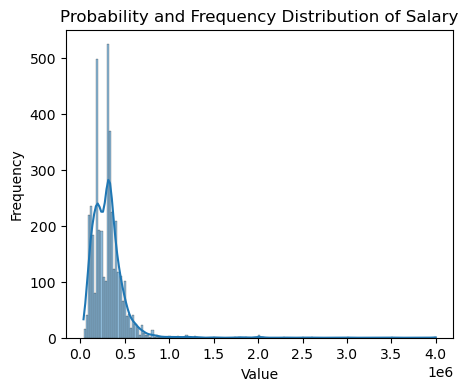

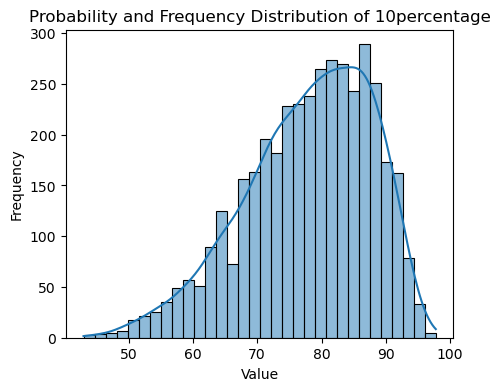

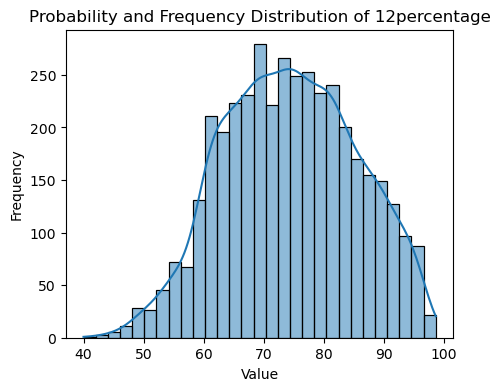

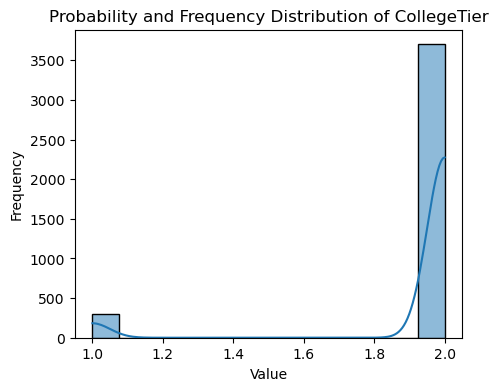

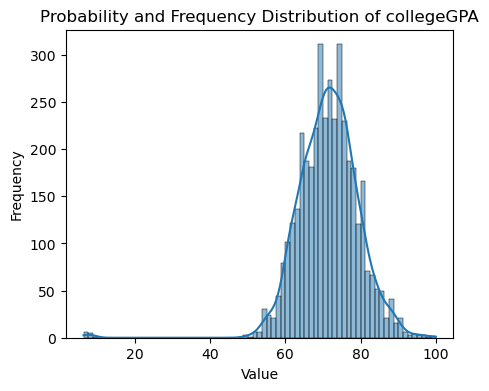

...

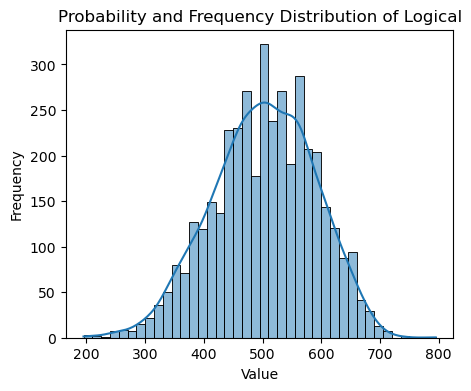

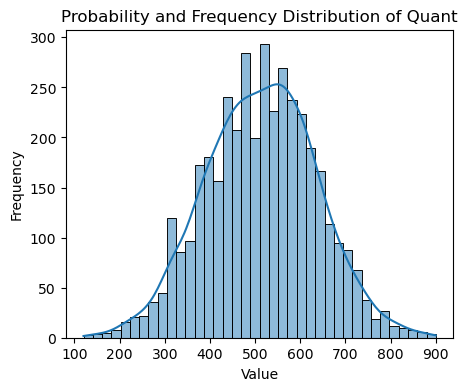

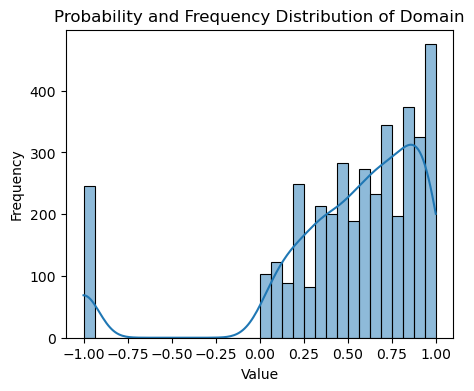

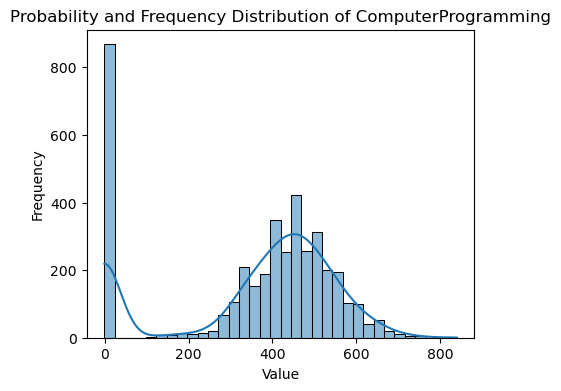

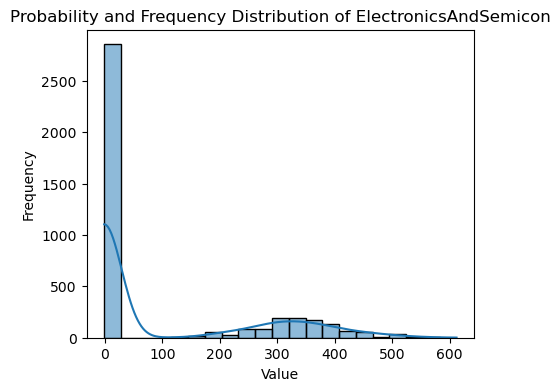

In [26]:
for column in df_[['Salary', '10percentage', '12percentage','CollegeTier', 'collegeGPA', 'CollegeCityTier','English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming','ElectronicsAndSemicon']].columns:
    plt.figure(figsize=(5, 4))
    sns.histplot(df_[column], kde=True)
    plt.title(f'Probability and Frequency Distribution of {column}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.show()


### Observation :- Above We can observe how the numerical data is distributed Based on there values .

In [27]:
df_[['Salary']].describe()

,Salary
count,3.998000e+03
mean,3.076998e+05
std,2.127375e+05
min,3.500000e+04
25%,1.800000e+05
50%,3.000000e+05
75%,3.700000e+05
max,4.000000e+06


### I want to see the density of salary as i took salary as dependent column 

In [28]:
px.histogram(df_['Salary'] , histnorm='density',title = 'Density plot on Salary')
# plt.title('Distribution plot of the salary')


In [29]:
df_['Salary'].min()

35000.0

In [30]:
df_['Salary'].max()

4000000.0

### Observation :- In this density curve we can see curve is right skewed values ranges where min value is 35K TO 4M

### I want to see the outliers in the each numerical columns ?

In [31]:
px.box(df_int , title = 'Box plot with numerical data outliers.')

### Observation : - we can see in above box plot more outliers on salary column in all numerical columns in data

### I want to check how the curve is shaped and is there any chance to convert in to bell shape if curve not in bell shape?

In [32]:
S1 = df_[df_['Salary'] <= df_['Salary'].quantile(0.95)]

In [33]:
x1 = df_['Salary']
x2 = S1['Salary']

# Group data together
hist_data = [x1, x2]

group_labels = ['all Data Values' ,'With quantile(0.95)',]

colors = ['#333F44', '#37AA9C']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors)

# Add title
fig.update_layout(title_text='''Curve and Rug Plot on Salary.''')
fig.show()

#### Observation : - in above distribution plot shows how the salary is distributed . In black line with outliers max value 4M data distribution as right skewd . Line belongs to green salary distrubution up to quantile 95% of salary

### I want to check is that 0.95 quantile is worked to change as bell shape ?

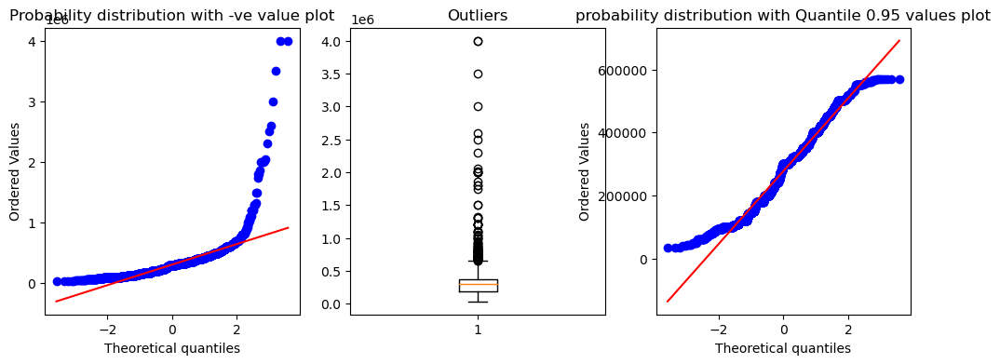

In [893]:
from scipy import stats
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
stats.probplot(df_['Salary'] , plot=plt)
plt.title('Probability distribution with -ve value plot')
plt.subplot(1,3,2)
plt.boxplot(df_['Salary'])
plt.title('Outliers')
plt.subplot(1,3,3)
stats.probplot(S1['Salary'] , plot=plt)
plt.title('probability distribution with Quantile 0.95 values plot')

plt.show()
plt.show()

### Observation :- we can see the qq plot how changes to 45 degree after removing up to 0.95 quantile values

In [34]:
print('The minimum salary earning is :',df_['Salary'].min())
print('the maximum salary earning is :' , df_['Salary'].max())
print('The average salary earnings ammong them is :',np.round(df_['Salary'].mean() ,2))
print('Earnings of 95% peoples in data is :',df_['Salary'].quantile(0.95))

The minimum salary earning is : 35000.0
the maximum salary earning is : 4000000.0
The average salary earnings ammong them is : 307699.85
Earnings of 95% peoples in data is : 570000.0


### I want to check outlieres in salary column based on the gender ?

In [36]:
px.box(x = df_['Salary'] , y = df_['Gender'] , title = 'outliers of salary based on gender')

#### Obsevation :- We can see here above box plot outliers based on Salary the min value in male is 35K in female is 35k and Maximum value in Male is 4M in female is 3.5M

In [37]:
df_int.columns

Index(['ID', 'Salary', '10percentage', '12percentage', 'CollegeID',
       'CollegeTier', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon'],
      dtype='object')

In [38]:
df_['Domain'].describe() # min value in negative replacing the min value with 

count    3998.000000
mean        0.510490
std         0.468671
min        -1.000000
25%         0.342315
50%         0.622643
75%         0.842248
max         0.999910
Name: Domain, dtype: float64

In [39]:
df_['Domain'].min()

-1.0

In [40]:
D1 = df_[df_['Domain'] > df_['Domain'].min()]

In [41]:
D1['Domain'].min()

0.002750145

### i want to check other numrical column is it in bell shape , if it not in bell is there any chance to get bell shape ?

In [42]:
x1 = df_['Domain']
x2 = D1['Domain']

# Group data together
hist_data = [x1, x2]

group_labels = ['With including -1', 'all +ve values']

colors = ['#333F44', '#37AA9C']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors)

# Add title
fig.update_layout(title_text='''Curve and Rug Plot on Domain.''')
fig.show()

#### Observation :- By removing the - ve value where the value = -1 in  the data points are converting towards the some normal distribution which like getting like symetrical.


### i want to check After removing the -1 is the  domain is it on 45 degree angle before and after ?

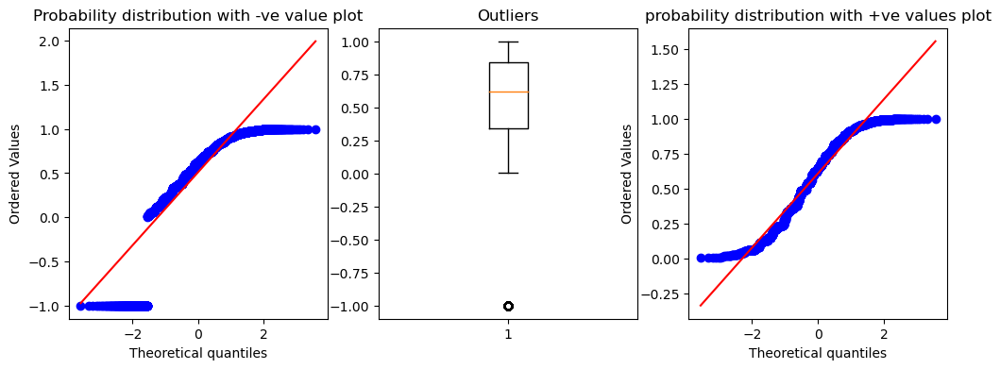

In [43]:
from scipy import stats
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
stats.probplot(df_['Domain'] , plot=plt)
plt.title('Probability distribution with -ve value plot')
plt.subplot(1,3,2)
plt.boxplot(df_['Domain'])
plt.title('Outliers')
plt.subplot(1,3,3)
stats.probplot(D1['Domain'] , plot=plt)
plt.title('probability distribution with +ve values plot')

plt.show()
plt.show()

-> We can see here visually the angle of data points to the 45 degrees

In [44]:
c1 = df_[df_['ComputerProgramming'] >df_['ComputerProgramming'].min()]

In [45]:
print('Min value :',df_['ComputerProgramming'].min())
print('average value :',df_['ComputerProgramming'].mean())
print('Max value :',df_['ComputerProgramming'].max())


Min value : -1
average value : 353.10280140070034
Max value : 840


#### Checking the curve how it distributed 

In [57]:
x1 = df_['ComputerProgramming']
x2 = c1['ComputerProgramming']
hist_data = [x1 ,x2]
group_labels = ['With including 0', 'Greater then 0 values']

colors = ['#333F44', '#37AA9C']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors)

# Add title
fig.update_layout(title_text='Curve and Rug Plot on ComputerProgramming ')
fig.show()

#### Observation :- By removing the - ve value where the value = -1 in  the data points are converting towards the some normal distribution which like getting like symetrical. Here the MIn  value = -1 , max  = 840 , and avg = 315.33 .

### how the qq plot is there after removing negative value

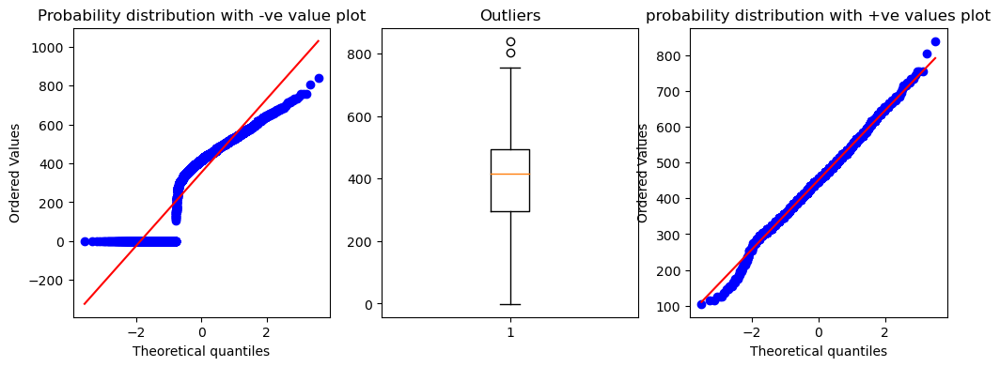

In [58]:
from scipy import stats
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
stats.probplot(df_['ComputerProgramming'] , plot=plt)
plt.title('Probability distribution with -ve value plot')
plt.subplot(1,3,2)
plt.boxplot(df_['ComputerProgramming'])
plt.title('Outliers')
plt.subplot(1,3,3)
stats.probplot(c1['ComputerProgramming'] , plot=plt)
plt.title('probability distribution with +ve values plot')

plt.show()
plt.show()

#### Observation:- We can see how the data points in QQplot changes to 45 DEGREE angle after removing the -1 value in ComputerProgramming column

### Checking the how distributed plot from values ?

In [59]:
print('Min value:',df_['ElectronicsAndSemicon'].min())
print('average :',df_['ElectronicsAndSemicon'].mean())
print('Max value :',df_['ElectronicsAndSemicon'].max())

Min value: -1
average : 95.32841420710355
Max value : 612


In [60]:
E1 = df_[df_['ElectronicsAndSemicon'] > df_['ElectronicsAndSemicon'].min()]

In [61]:
x1 = df_['ElectronicsAndSemicon']
x2 = E1['ElectronicsAndSemicon']
hist_data = [x1 ,x2]
group_labels = ['With including 0', 'all +ve values']

colors = ['#333F44', '#37AA9C']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors)

# Add title
fig.update_layout(title_text='Curve and Rug Plot on ElectronicsAndSemicon')
fig.show()

#### Observation :- By removing the - ve value where the value = -1 in the data points are converting towards the some normal distribution which like getting like symetrical. Here the MIn value = -1 , max = 612 , and avg = 95.32 .¶

### Checking the qq plot after removing the negative values

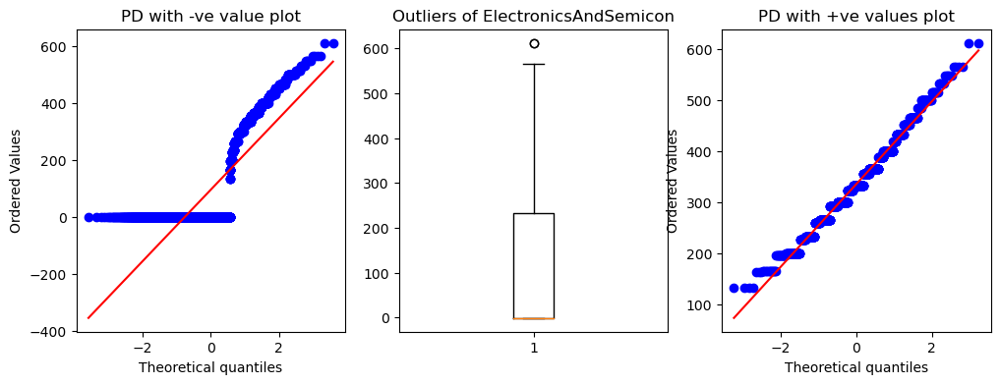

In [62]:
from scipy import stats
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
stats.probplot(df_['ElectronicsAndSemicon'] , plot=plt)
plt.title('PD with -ve value plot')
plt.subplot(1,3,2)
plt.boxplot(df_['ElectronicsAndSemicon'] )
plt.title('Outliers of ElectronicsAndSemicon')
plt.subplot(1,3,3)
stats.probplot(E1['ElectronicsAndSemicon'] , plot=plt)
plt.title('PD with +ve values plot')

plt.show()
plt.show()

#### We can see how the data points in QQplot changes to 45 DEGREE angle after removing the -1 value in ElectronicsAndSemicon column

In [63]:
df_['Designation'].nunique()

419

In [64]:
df_['Designation'] = df_['Designation'].str.strip()

In [65]:
df_['Designation'].nunique()

419

### What are the count of Desigantions in data ?

In [66]:
print('Total no of the designations :',df_['Designation'].count())
print('------------------------------------------------------------------------------------------')
print(df_['Designation'].value_counts().head(50))

px.bar(df_['Designation'].value_counts().head(50) , title = 'Count of Some top 50 Designations')

Total no of the designations : 3998
------------------------------------------------------------------------------------------
software engineer                    539
software developer                   265
system engineer                      205
programmer analyst                   139
systems engineer                     118
java software engineer               111
software test engineer               100
project engineer                      77
technical support engineer            76
senior software engineer              72
java developer                        67
test engineer                         57
web developer                         54
application developer                 52
assistant manager                     52
network engineer                      51
data analyst                          49
business analyst                      49
engineer                              47
android developer                     46
associate software engineer           46
programmer  

#### Observation :- In above plot we can observe there are  some Top 50 Designations in data where Software engineers are around 539 count. So Software engineers are max in data. second place is Software developers they are around 265 count in data.

In [67]:
df_['Specialization'].nunique()

46

### What is the different count of specialization in data ?

In [68]:
df_['Specialization'] = df_['Specialization'].str.strip()

In [69]:
df_['Specialization'].nunique()

46

In [70]:
print(df_['Specialization'].value_counts().head(20))
px.bar(df_['Specialization'].value_counts().head(20) , title = 'some top 20 specializations based on count in data ')

electronics and communication engineering      880
computer science & engineering                 744
information technology                         660
computer engineering                           600
computer application                           244
mechanical engineering                         201
electronics and electrical engineering         196
electronics & telecommunications               121
electrical engineering                          82
electronics & instrumentation eng               32
civil engineering                               29
electronics and instrumentation engineering     27
information science engineering                 27
instrumentation and control engineering         20
electronics engineering                         19
biotechnology                                   15
other                                           13
industrial & production engineering             10
applied electronics and instrumentation          9
chemical engineering           

#### Obsevation :- In this plot most of them are from ECE in data ,second are from CSE , in third place IT specilization are there

In [71]:
df_.shape

(3998, 24)

In [72]:
df_.head()

,ID,Salary,10percentage,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,English,...,ElectronicsAndSemicon,DOL,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState
0,203097,420000.0,84.3,95.8,1141,2,78.00,1141,0,515,...,-1,present,senior quality engineer,Bangalore,f,"board ofsecondary education,ap","board of intermediate education,ap",B.Tech/B.E.,computer engineering,Andhra Pradesh
1,579905,500000.0,85.4,85.0,5807,2,70.06,5807,0,695,...,466,present,assistant manager,Indore,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Madhya Pradesh
2,810601,325000.0,85.0,68.2,64,2,70.00,64,0,615,...,-1,present,systems engineer,Chennai,f,cbse,cbse,B.Tech/B.E.,information technology,Uttar Pradesh
3,267447,1100000.0,85.6,83.6,6920,1,74.64,6920,1,635,...,-1,present,senior software engineer,Gurgaon,m,cbse,cbse,B.Tech/B.E.,computer engineering,Delhi
4,343523,200000.0,78.0,76.8,11368,2,73.90,11368,0,545,...,233,01-03-2015 00:00,get,Manesar,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh


In [73]:
df_['JobCity'].nunique()

339

In [74]:
df_['JobCity'].str.strip().nunique()

301

In [75]:
df_['JobCity'] = df_['JobCity'].str.strip()

### What is the count of Job citys in data 

In [76]:
df_['JobCity'].value_counts()

Bangalore           641
-1                  461
Noida               370
Hyderabad           345
Pune                296
                   ... 
raipur                1
indore                1
Salem                 1
Bankura               1
Asifabadbanglore      1
Name: JobCity, Length: 301, dtype: int64

In [77]:
# Removing where the city name  == -1
# Analaysis based on after removing -1 in the Job city
df_[df_['JobCity'] == '-1']

,ID,Salary,10percentage,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,English,...,ElectronicsAndSemicon,DOL,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState
15,536517,350000.0,69.54,64.43,4501,2,63.00,4501,0,485,...,-1,present,network engineer,-1,f,icse,isc,B.Tech/B.E.,information technology,Uttar Pradesh
21,339689,200000.0,75.67,74.40,11368,2,74.01,11368,0,385,...,-1,01-12-2013 00:00,software engineer,-1,f,up,up,B.Tech/B.E.,information technology,Uttar Pradesh
39,533417,200000.0,88.00,89.66,867,2,76.40,867,0,510,...,233,01-06-2013 00:00,management trainee,-1,m,kerala state technical education,kerala state hse board,B.Tech/B.E.,electronics and communication engineering,Kerala
77,754392,120000.0,76.00,72.00,8888,2,63.20,8888,0,510,...,-1,present,test engineer,-1,m,state board,state board,B.Tech/B.E.,computer science & engineering,Tamil Nadu
79,1089852,100000.0,86.00,95.00,4726,2,78.60,4726,0,405,...,356,01-05-2014 00:00,software developer,-1,f,state board,state board,B.Tech/B.E.,electronics and communication engineering,Telangana
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3937,385546,205000.0,84.80,81.40,100,2,83.50,100,0,485,...,300,01-02-2014 00:00,production engineer,-1,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Haryana
3942,1067015,280000.0,78.00,91.00,11183,2,64.62,11183,1,405,...,-1,present,software engineer,-1,m,state board,state board,B.Tech/B.E.,electronics and communication engineering,Telangana
3954,531726,310000.0,88.40,92.90,492,2,69.37,492,1,440,...,366,01-04-2015 00:00,business intelligence analyst,-1,f,ssc,board of intermediate,B.Tech/B.E.,electronics and communication engineering,Telangana
3973,755067,335000.0,66.85,59.11,1906,2,82.10,1906,1,520,...,-1,present,programmer analyst,-1,m,state board,state board,B.Tech/B.E.,information technology,West Bengal


In [78]:
df_city = df_[df_['JobCity'] != '-1']

In [79]:
df_['JobCity'] = df_['JobCity'].str.strip()

In [80]:
print(df_city['JobCity'].value_counts().head(20))
px.bar(df_city['JobCity'].value_counts().head(20) , title = 'some top 20 Job citys based on count in data ')

Bangalore        641
Noida            370
Hyderabad        345
Pune             296
Chennai          280
Gurgaon          205
New Delhi        198
Mumbai           112
Kolkata           99
Jaipur            47
Mysore            38
Lucknow           37
Navi Mumbai       32
chennai           28
pune              27
Chandigarh        27
Greater Noida     26
Indore            24
Bhubaneswar       23
Coimbatore        20
Name: JobCity, dtype: int64


#### We can observe here Top 1 Job city in india is Banglore , Second place taken by Noida and Our Hyderabad in on THIRED place

### How the college gpa is depends on the salary ?

In [81]:
print('College Min GPA',df_['collegeGPA'].min())
print('College Avg GPA:',df_['collegeGPA'].mean())
print('College Max GPA:',df_['collegeGPA'].max())


College Min GPA 6.45
College Avg GPA: 71.48617058529268
College Max GPA: 99.93


In [82]:
px.scatter(y = df_['Salary'],x = df_['collegeGPA'] , title = 'Scatter plot on CollegeGPA on Salary')

#### Here we can observe Where the college GPA is Up to 10 but not  More then 10 GPA So Iam taking data points which are less then 10 and converting them into percentage by domain knowlege.

In [83]:
df_[df_['collegeGPA'] <= 10.0]['Degree'].unique()

array(['B.Tech/B.E.', 'M.Tech./M.E.'], dtype=object)

### formula to convet the 'B.Tech/B.E.', 'M.Tech./M.E'.  to Percentage of Marks = (CGPA – 0.75) * 10

In [84]:
df_[df_['collegeGPA'] <= 10]

,ID,Salary,10percentage,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,English,...,ElectronicsAndSemicon,DOL,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState
7,912934,400000.0,92.00,91.00,1757,1,8.58,1757,0,545,...,-1,01-07-2015 00:00,mechanical engineer,Bangalore,m,cbse,cbse,B.Tech/B.E.,mechanical engineering,Tamil Nadu
138,964319,195000.0,79.60,87.58,7586,2,6.63,7586,0,380,...,-1,01-01-2015 00:00,business development managerde,coimbatore,m,matriculation,0,B.Tech/B.E.,information technology,Tamil Nadu
788,249853,180000.0,66.50,65.50,272,2,6.80,272,0,465,...,300,01-06-2013 00:00,electrical project engineer,Jowai,m,cbse,cbse,M.Tech./M.E.,electrical and power engineering,Punjab
1419,1262900,180000.0,58.90,68.00,1808,2,6.85,1808,0,490,...,-1,01-04-2015 00:00,java software engineer,Chennai,m,state board,state board,B.Tech/B.E.,computer science & engineering,Tamil Nadu
1439,299447,360000.0,73.06,74.00,11664,2,8.07,11664,0,375,...,366,present,assistant professor,AM,m,nagpur board,nagpur board,M.Tech./M.E.,electronics engineering,Maharashtra
1767,813008,180000.0,69.00,76.00,13388,2,7.56,13388,0,380,...,-1,01-08-2014 00:00,it technician,Bhopal,m,state board,state board,B.Tech/B.E.,mechanical engineering,Madhya Pradesh
2151,262814,145000.0,61.30,63.00,4043,2,6.95,4043,0,465,...,-1,01-04-2013 00:00,web developer,New Delhi,m,up board,up board,B.Tech/B.E.,information technology,Uttar Pradesh
2229,868740,240000.0,94.40,86.00,8888,2,8.13,8888,0,535,...,-1,01-04-2015 00:00,product development engineer,Chennai,m,state board,state board,B.Tech/B.E.,mechanical engineering,Tamil Nadu
2293,407736,490000.0,89.60,80.33,3801,2,9.30,3801,0,535,...,-1,01-12-2014 00:00,software engineer,-1,f,karnataka board,karnataka board secondary education,B.Tech/B.E.,computer engineering,Karnataka
2662,240465,470000.0,77.38,75.00,253,2,8.88,253,1,445,...,-1,01-03-2015 00:00,systems engineer,Kolkata,m,west bengal board of secondary examination (wb...,west bengal council of higher secondary examin...,B.Tech/B.E.,information technology,West Bengal


### Replaced where the data in collegeGPA columns contains less than 10 GPA as its percentage

In [85]:
p_values = []
for i in df_['collegeGPA']:
#     value = df_['collegeGPA']
    if i <= 10.0:
        p = (i - 0.75)*10
        p_values.append(p)
    else:
        p_values.append(i)
df_['collegeGPA with percentage'] = p_values

In [86]:
df_['collegeGPA with percentage'].min()

49.07

In [87]:
df_[df_['collegeGPA with percentage'] <= 10.0]

,ID,Salary,10percentage,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,English,...,DOL,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState,collegeGPA with percentage


In [88]:
px.scatter(y = df_['Salary'],x = df_['collegeGPA with percentage'] , title = 'Scatter plot on CollegeGPA with percentage on Salary')

#### observation :- here the data of collegeGPA in percentage  so the gpa not importent for more salary earnings  we can see person with 65% earning 4M ammount in data . the person with 100% percentage gpa earning 440K amount in data.

### How the 10th and 12th percentage are corelated

In [89]:
print('Minimum GPA of collegeGPA with percentage :',df_['collegeGPA with percentage'].min())
print('Average GPA of collegeGPA with percentage :',df_['collegeGPA with percentage'].mean())
print('Maximum GPA of collegeGPA with Percentage :',df_['collegeGPA with percentage'].max())

Minimum GPA of collegeGPA with percentage : 49.07
Average GPA of collegeGPA with percentage : 71.67321660830416
Maximum GPA of collegeGPA with Percentage : 99.93


In [90]:
px.scatter(y = df_['12percentage'],x = df_['10percentage'] , title = 'Scatter plot on 12percentage on ith percentage on 10percentage')

In [91]:
df_.columns

Index(['ID', 'Salary', '10percentage', '12percentage', 'CollegeID',
       'CollegeTier', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'DOL', 'Designation', 'JobCity', 'Gender',
       '10board', '12board', 'Degree', 'Specialization', 'CollegeState',
       'collegeGPA with percentage'],
      dtype='object')

### How the english and logical columns are scatterd ?

In [92]:
px.scatter(y = df_['English'],x = df_['Logical'] , title = 'Scatter plot on English  on  the Logical')

### How the quant and logical are scatterd ?

In [93]:
px.scatter(y = df_['Quant'],x = df_['Logical'] , title = 'Scatter plot on Quant  on  the Logical')

### Grouping them by degree , specialization on salarey how they were related

In [94]:
df_deg = df_.groupby(['Degree','Specialization'])[['Salary']].mean().reset_index()

print('Salary according to the Specialization ')
print('*******************************************************************')

print('Maximum salary of person :',df_deg[df_deg['Salary'] == df_deg['Salary'].max()])
print('Minimum salary of person :',df_deg[df_deg['Salary'] == df_deg['Salary'].min()])


Salary according to the Specialization 
*******************************************************************
Maximum salary of person :           Degree          Specialization     Salary
45  M.Tech./M.E.  electrical engineering  1860000.0
Minimum salary of person :           Degree Specialization   Salary
46  M.Tech./M.E.    electronics  40000.0


In [95]:
df_gpa = df_.groupby(['Degree','collegeGPA with percentage'])[['Salary']].mean().reset_index()
df_gpa

,Degree,collegeGPA with percentage,Salary
0,B.Tech/B.E.,49.07,350000.000000
1,B.Tech/B.E.,50.00,140000.000000
2,B.Tech/B.E.,51.00,110000.000000
3,B.Tech/B.E.,51.80,180000.000000
4,B.Tech/B.E.,52.00,136250.000000
...,...,...,...
1398,MCA,88.90,820000.000000
1399,MCA,89.00,383333.333333
1400,MCA,89.70,60000.000000
1401,MCA,90.00,350000.000000


In [96]:
px.scatter(y = df_gpa['collegeGPA with percentage'],x = df_gpa['Salary'] , title = 'Scatter plot on College gpa in percentage with salary')

### Obsrvation:- in this plot we can maximum persons had good percentage but they are not earnig big ammount only few members are earning more than 1M

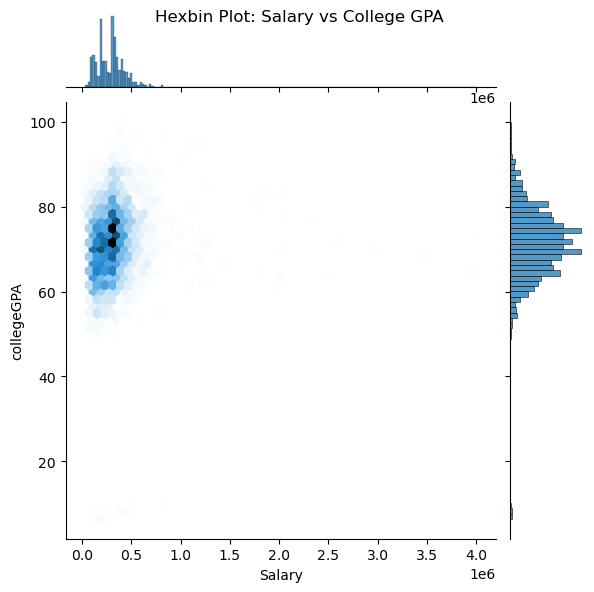

In [97]:
sns.jointplot(x='Salary', y='collegeGPA', data=df_, kind='hex')
plt.suptitle('Hexbin Plot: Salary vs College GPA')
plt.show()

In [950]:
df_['Degree'] = df_['Degree'].str.strip()

In [951]:
crosstab_deg =pd.crosstab(df_['Gender'],df_['Degree'])
crosstab_deg

Degree,B.Tech/B.E.,M.Sc. (Tech.),M.Tech./M.E.,MCA
Gender,,,,
f,889,1,9,58
m,2811,1,44,185


#### Observation :- Male and female count on degree based through cross tab

AxesSubplot(0.125,0.11;0.775x0.77)


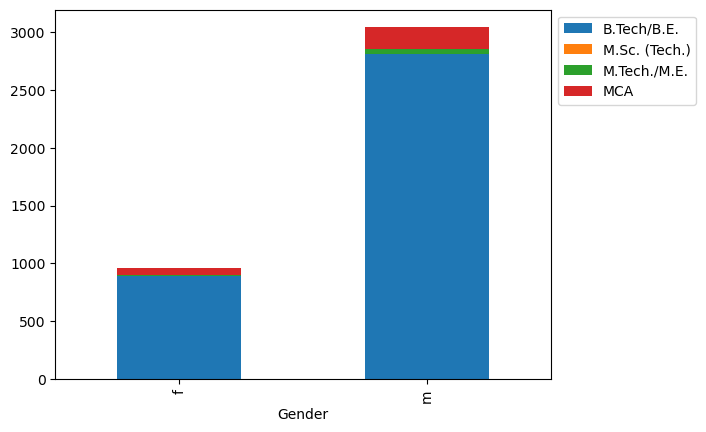

In [952]:
print(crosstab_deg.plot(kind='bar',stacked=True))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

#### Oservation :- here the stacked plot based on the degree and the gender maximum male and female are from Btech , then second MCA

In [953]:
pivot_table_col_tier = pd.pivot_table(df, values=['Salary', '10percentage','collegeGPA','12percentage'], 
                              index=['CollegeTier'], 
                              aggfunc={'Salary': 'mean', '10percentage': 'mean' , 'collegeGPA':'mean','12percentage':'mean'})
pivot_table_col_tier

,10percentage,12percentage,Salary,collegeGPA
CollegeTier,,,,
1,82.307576,78.378855,442356.902357,73.987845
2,77.573783,74.152394,296893.812483,71.285415


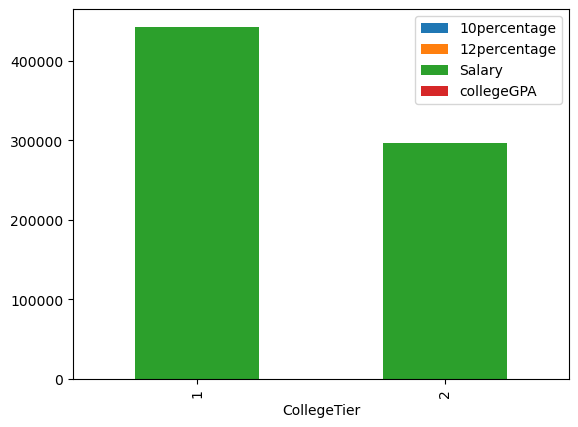

In [954]:
pivot_table_col_tier.plot(kind='bar',stacked=True)
plt.show()

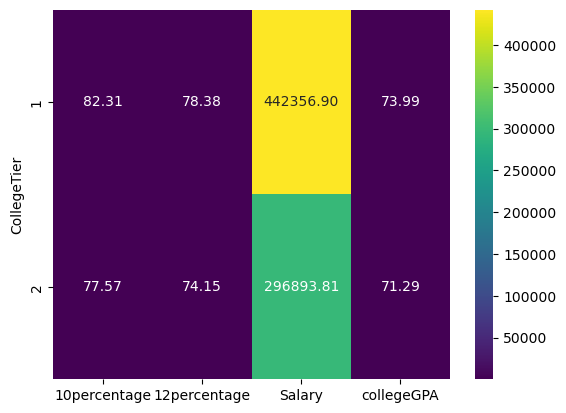

In [955]:
sns.heatmap(pivot_table_col_tier, annot=True, cmap='viridis', fmt='.2f')
plt.show()

#### Obsevation :- This pivot table tells us based on college tier average of 10percentage, 12percentage , salary and collegegpa and the plot shows the heat map of above pivot table how the values are lies

In [956]:
df_


,ID,Salary,10percentage,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,English,...,DOL,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState,collegeGPA with percentage
0,203097,420000.0,84.30,95.80,1141,2,78.00,1141,0,515,...,present,senior quality engineer,Bangalore,f,"board ofsecondary education,ap","board of intermediate education,ap",B.Tech/B.E.,computer engineering,Andhra Pradesh,78.00
1,579905,500000.0,85.40,85.00,5807,2,70.06,5807,0,695,...,present,assistant manager,Indore,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Madhya Pradesh,70.06
2,810601,325000.0,85.00,68.20,64,2,70.00,64,0,615,...,present,systems engineer,Chennai,f,cbse,cbse,B.Tech/B.E.,information technology,Uttar Pradesh,70.00
3,267447,1100000.0,85.60,83.60,6920,1,74.64,6920,1,635,...,present,senior software engineer,Gurgaon,m,cbse,cbse,B.Tech/B.E.,computer engineering,Delhi,74.64
4,343523,200000.0,78.00,76.80,11368,2,73.90,11368,0,545,...,01-03-2015 00:00,get,Manesar,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh,73.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,47916,280000.0,52.09,55.50,6268,2,61.50,6268,0,365,...,01-10-2012 00:00,software engineer,New Delhi,m,cbse,cbse,B.Tech/B.E.,information technology,Haryana,61.50
3994,752781,100000.0,90.00,93.00,4883,2,77.30,4883,1,415,...,01-07-2013 00:00,technical writer,Hyderabad,f,state board,state board,B.Tech/B.E.,electronics and communication engineering,Telangana,77.30
3995,355888,320000.0,81.86,65.50,9786,2,70.00,9786,0,475,...,present,associate software engineer,Bangalore,m,"bse,odisha","chse,odisha",B.Tech/B.E.,computer engineering,Orissa,70.00
3996,947111,200000.0,78.72,69.88,979,2,70.42,979,1,450,...,01-01-2015 00:00,software developer,Asifabadbanglore,f,state board,state board,B.Tech/B.E.,computer science & engineering,Karnataka,70.42


In [957]:
pivot_table_disg = pd.pivot_table(df, values=['Salary', '10percentage','collegeGPA','12percentage'], 
                              index=['Gender'], 
                              aggfunc={'Salary': 'mean', '10percentage': 'mean' , 'collegeGPA':'mean','12percentage':'mean'})

In [958]:
pivot_table_disg

,10percentage,12percentage,Salary,collegeGPA
Gender,,,,
f,80.932894,77.007618,294937.304075,74.048056
m,76.979000,73.666636,311716.211772,70.679947


<AxesSubplot:ylabel='Gender'>

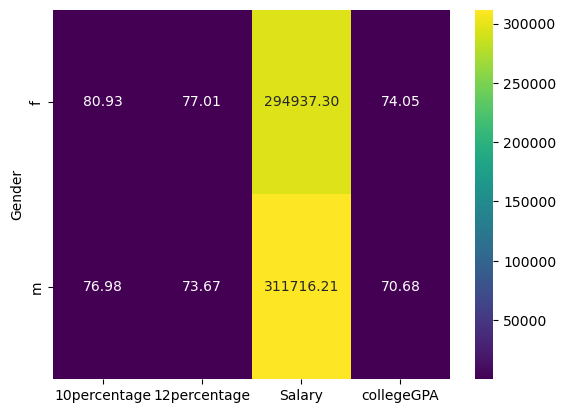

In [959]:
sns.heatmap(pivot_table_disg , annot=True, cmap='viridis', fmt='.2f')

In [960]:
pivot_table_dg = pd.pivot_table(df, values=['Salary', '10percentage','collegeGPA','12percentage'], 
                              index=['Degree'], 
                              aggfunc={'Salary': 'mean', '10percentage': 'mean' , 'collegeGPA':'mean','12percentage':'mean'})

In [961]:
pivot_table_dg

,10percentage,12percentage,Salary,collegeGPA
Degree,,,,
B.Tech/B.E.,78.594568,75.131473,308622.702703,71.283778
M.Sc. (Tech.),73.000000,55.600000,320000.000000,75.600000
M.Tech./M.E.,76.893774,74.215472,366132.075472,75.334717
MCA,68.002675,64.549218,280802.469136,73.694609


#### Here the avg of 10percentage , 12 percentage , salary , collegeGPA on Degree

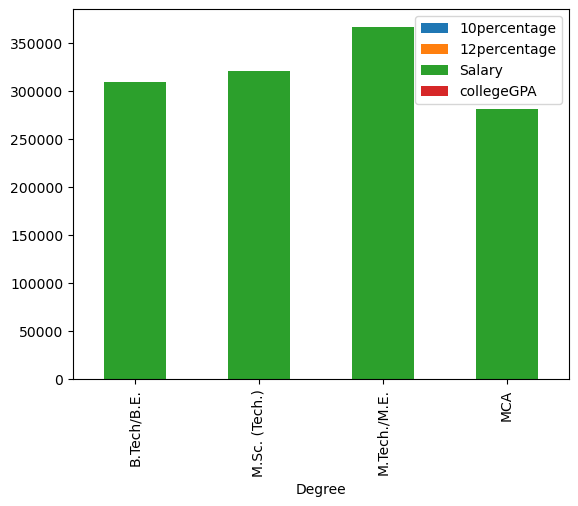

In [962]:
pivot_table_dg.plot(kind='bar',stacked=True)
plt.show()

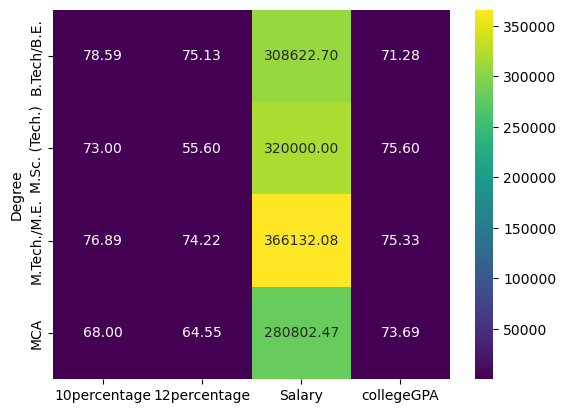

In [963]:
sns.heatmap(pivot_table_dg, annot=True, cmap='viridis', fmt='.2f')
plt.show()

### Heat map shows the values based on Degree 

In [964]:
df_.columns

Index(['ID', 'Salary', '10percentage', '12percentage', 'CollegeID',
       'CollegeTier', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'DOL', 'Designation', 'JobCity', 'Gender',
       '10board', '12board', 'Degree', 'Specialization', 'CollegeState',
       'collegeGPA with percentage'],
      dtype='object')

### Correlation plot 

In [965]:
df_.columns

Index(['ID', 'Salary', '10percentage', '12percentage', 'CollegeID',
       'CollegeTier', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'DOL', 'Designation', 'JobCity', 'Gender',
       '10board', '12board', 'Degree', 'Specialization', 'CollegeState',
       'collegeGPA with percentage'],
      dtype='object')

In [102]:
df_cor = df_[['Salary', '10percentage', '12percentage','collegeGPA with percentage', 'CollegeID','CollegeTier', 'collegeGPA', 'CollegeCityID']]

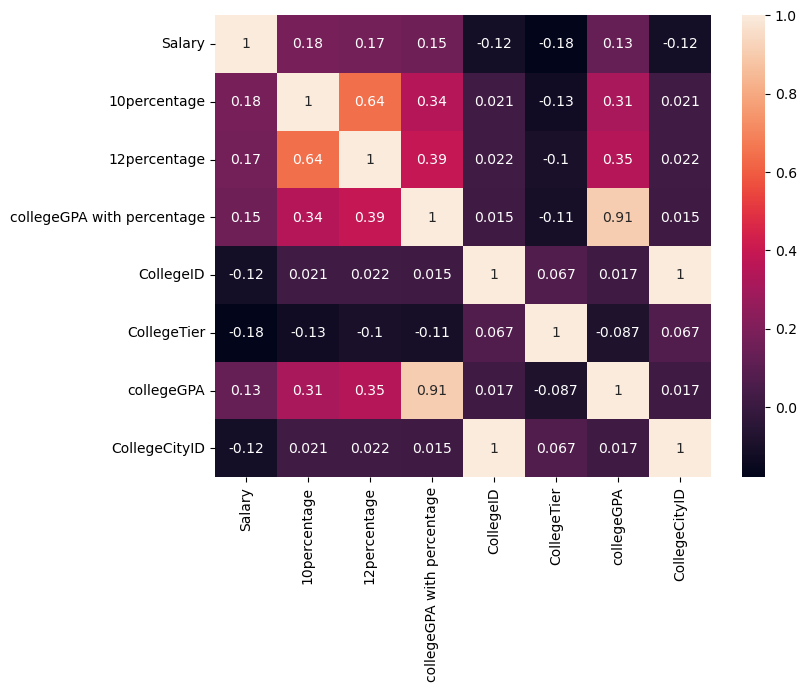

In [103]:
plt.figure(figsize=(8,6))

sns.heatmap(df_cor.corr(),annot=True)
plt.show()

### Observation :- Correlation on the College GPA and Salary are high if college gpa is more then there had a chance to get more salary means increasing the college gpa then salary also get increase

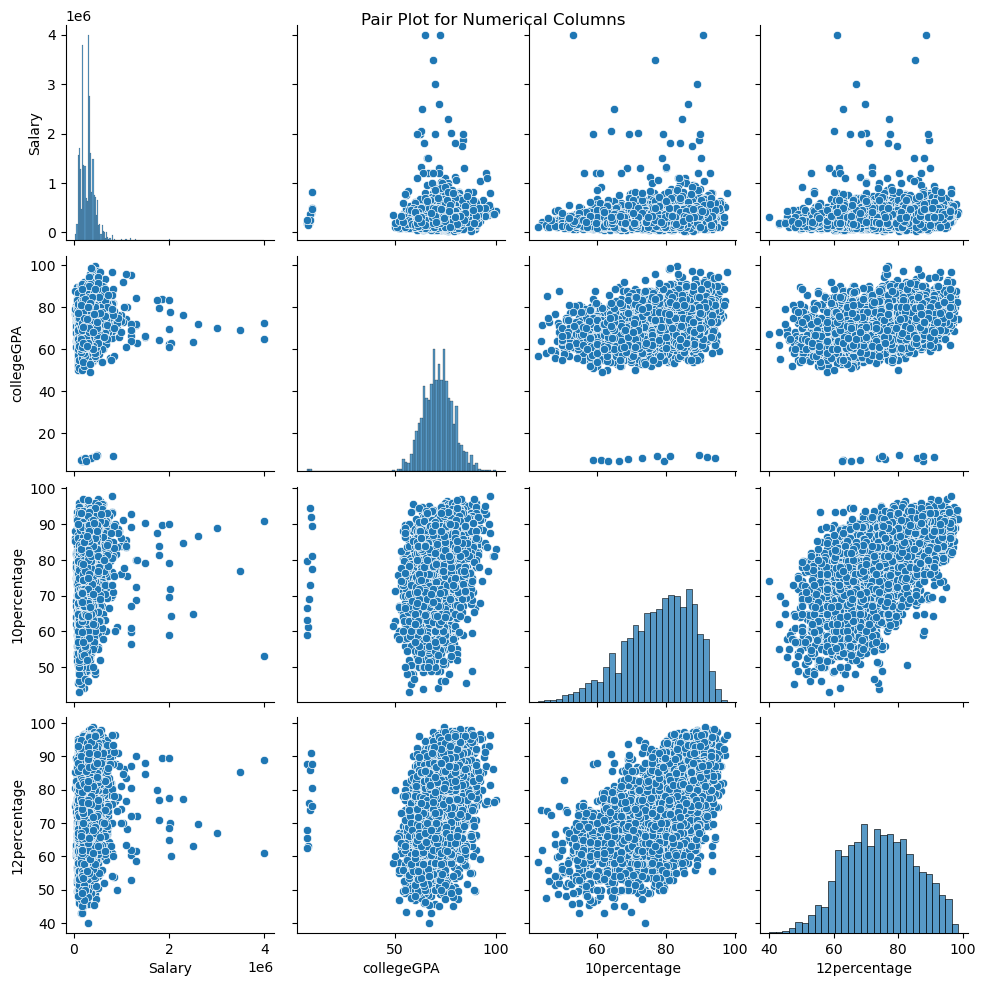

In [99]:
sns.pairplot(df_[['Salary', 'collegeGPA', '10percentage', '12percentage']])
plt.suptitle('Pair Plot for Numerical Columns')
plt.show()

### Performing the anova test to check there is any difference  in salaries among different job roles.

In [100]:
from scipy.stats import f_oneway

result_anova = f_oneway(*[df_['Salary'][df_['Designation'] == designation] for designation in df_['Designation'].unique()])
print("ANOVA p-value:", result_anova.pvalue)


ANOVA p-value: 4.3117145828957174e-38


#### Performing the chi-sqaure test for is there any association between gender and specialization.

In [101]:
from scipy.stats import chi2_contingency

# Example: Chi-square test
contingency_table = pd.crosstab(df_['Gender'], df_['Specialization'])
chi2, p, _, _ = chi2_contingency(contingency_table)
print("Chi-square p-value:", p)


Chi-square p-value: 1.2453868176976918e-06
